In [2]:
import functools

import wandb
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.optimize import fsolve, curve_fit, minimize, least_squares
from IPython.display import clear_output
from matplotlib import ticker

from notebooks.utils import *

In [3]:
from datetime import datetime, timezone
from zoneinfo import ZoneInfo

dt_local = datetime(2025, 9, 13, 21, 0, tzinfo=ZoneInfo("Europe/Zurich"))
dt_utc = dt_local.astimezone(timezone.utc)

runs, histories, config_df = load_runs(
    filters={
        # "tags": "crit_bs_l8_d512",
        "$and": [
            # {"$not": {"tags": "flagged"}},
            {"$or": [
                {"tags": "crit_bs_l8_d512"},
                {"tags": "crit_bs_l10_d640"},
                {"tags": "crit_bs_l12_d768"},
                {"tags": "crit_bs_l16_d1024"},
                {"tags": "crit_bs_l20_d1536"},
                {"tags": "scaling_laws"},
            ]},
            {"created_at": {"$gte": dt_utc.isoformat()}}
        ],
    },
    order="+created_at",
    drop_duplicates=["num_layers", "hidden_size", "learning_rate", "batch_size", "hybrid_mixing_shift"],
)

config_df = config_df.reset_index()

# config_df = config_df.sort_values(["total_steps", "final_elbo"], ascending=[False, True])#.drop_duplicates(subset=["num_layers", "hidden_size", "learning_rate", "batch_size", "hybrid_mixing_shift"])
len(config_df)

Processing runs:   0%|          | 0/718 [00:00<?, ?it/s]

Skipping run gidd-L8-D512-H8-N2048-bs=32-lr=0.3-noise_mask with insufficient steps: None
Skipping run gidd-L8-D512-H8-N2048-bs=256-lr=0.5-noise_uniform with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=1.0-noise_low_uniform with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=1.0-noise_high_uniform with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=1.0-noise_balanced with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=0.3-noise_uniform with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=0.3-noise_high_uniform with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=0.3-noise_balanced with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=1.0-noise_uniform with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048-bs=256-lr=1.0-noise_mask with insufficient steps: None
Skipping run gidd-L16-D1024-H16-N2048

584

In [4]:
def get_noise_label(hybrid_mixing_shift):
    if hybrid_mixing_shift == 0.0:
        return "balanced"
    if hybrid_mixing_shift <= -1e2:
        return "masked"
    if hybrid_mixing_shift >= 1e2:
        return "uniform"
    if hybrid_mixing_shift < 0:
        return "low-uniform"
    if hybrid_mixing_shift > 0:
        return "high-uniform"

colors = {
    -1000.0: (58, 76, 192),
    -2.0: (141, 175, 253),
    0.0: (122, 220, 121),
    2.0: (243, 152, 121),
    1000.0: (179, 3, 38),
}

In [5]:
max_loss = 4.4
min_loss = float(min(h["train/elbo_ema"].min() for h in histories if "train/elbo_ema" in h))

loss_targets = np.logspace(np.log10(min_loss), np.log10(max_loss), 64)[::-1]

min_loss, max_loss

(2.7647556708452172, 4.4)

In [6]:
def f(xs, a=1.0, alpha=0.1, b=1.0, beta=1.0, c=1.0, gamma=1e-4, E=0.0):
    return np.exp(a) * xs[0]**-np.exp(alpha) + np.exp(b) * (xs[1])**-np.exp(beta) + np.exp(c) * xs[2]**-np.exp(gamma) + np.exp(E)

def loss(params, steps, batch_size, popt=None):
    assert popt is not None
    return f((params, steps, batch_size), *popt)

def loss_from_tokens(params, tokens, batch_size=None, steps=None, popt=None):
    assert popt is not None
    assert not (steps is None and batch_size is None)
    if steps is None:
        steps = tokens / batch_size
    if batch_size is None:
        batch_size = tokens / steps
    return f((params, steps, batch_size), *popt)

def loss_from_flops(flops, batch_size, params=None, tokens=None, popt=None):
    assert popt is not None
    assert not (tokens is None and params is None)
    if tokens is None:
        tokens = flops / (6*params)
    if params is None:
        params = flops / (6*tokens)
    steps = tokens / batch_size
    return f((params, steps, batch_size), *popt)

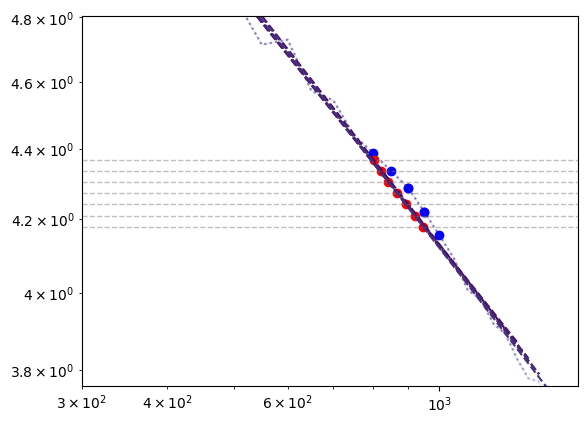

In [7]:
h = histories[1]

vmin, vmax = loss_targets.min(), loss_targets.max()

def color(x):
    cmap = plt.get_cmap("viridis_r")
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    return cmap(norm(x))

steps = h["_step"]
loss = h["train/elbo"]
plt.plot(steps, loss, alpha=0.1)

targets = loss_targets[1:8]

min_step, max_step = 100000, 0
for target_loss in targets:
    plt.axhline(target_loss, color="gray", linestyle="--", linewidth=1.0, alpha=0.5)
    loss = h["train/elbo"]
    steps = h["_step"]
    delta = (loss - target_loss) / target_loss
    idx = delta.abs().idxmin()
    x, y = steps.iloc[idx], loss.iloc[idx]
    plt.scatter([x], [y], marker="o", color="blue")
    min_idx = min(idx - 10, int(idx * 0.9))
    max_idx = max(idx + 10, int(idx * 1.1))
    xs = steps.iloc[min_idx:max_idx]
    ys = loss.iloc[min_idx:max_idx]
    min_step = min(min_step, xs.min())
    max_step = max(max_step, xs.max())
    plt.plot(xs, ys, color=color(target_loss), alpha=0.1, linestyle=":")
    
    # fit line using polyfit
    coeffs = np.polyfit(np.log(xs), np.log(ys), 1)
    b, a = coeffs
    loss_fit = np.exp(a + np.log(xs)*b)
    target_step = np.exp((np.log(target_loss) - a) / b)
    plt.scatter([target_step], [target_loss], marker="o", color="red")
    plt.plot(xs, loss_fit, "--", color=color(target_loss))

plt.ylim(0.9 * targets.min(), 1.1 * targets.max())
plt.xlim(min_step, max_step*1.1)
plt.xscale("log")
plt.yscale("log")

In [8]:

data = []
for row in config_df.itertuples():
    h = histories[row.Index]
    steps = h["_step"]
    max_step = steps.max()
    loss = h["train/elbo"]
    for target_loss in loss_targets:

        delta = (loss - target_loss) / target_loss
        idx = delta.abs().idxmin()

        min_idx = min(idx - 10, int(idx * 0.9))
        max_idx = max(idx + 10, int(idx * 1.1))
        xs = steps.iloc[min_idx:max_idx]
        ys = loss.iloc[min_idx:max_idx]

        # log(loss) = a + b * log(steps)
        coeffs = np.polyfit(np.log(xs), np.log(ys), 1)
        b, a = coeffs
        if b > 0.0:
            # print("Warning: positive scaling exponent", row.Index, b)
            continue

        target_step = np.exp((np.log(target_loss) - a) / b)
        if np.isnan(target_step) or not np.isfinite(target_step):
            continue
        if target_step < 2000 or target_step > max_step:
            # print("Warning: target step out of range", row.Index, target_step, max_step)
            continue
        
        # row["target_loss"]
        # row["steps"] = target_step
        # row["tokens"] = target_step * row["batch_size"] * row["max_seq_len"]
        # row["flops"] = 6 * row["non_emb_params"] * row["tokens"]

        # print("appending row")

        data.append({
            "target_loss": target_loss,
            "steps": target_step,
            "tokens": target_step * row.batch_size * row.max_seq_len,
            "flops": 6 * row.non_emb_params * target_step * row.max_seq_len,
            "max_seq_len": row.max_seq_len,
            "hybrid_mixing_shift": row.hybrid_mixing_shift,
            "num_layers": row.num_layers,
            "hidden_size": row.hidden_size,
            "batch_size": row.batch_size,
            "lr": row.lr,
            "beta2": row.beta2,
            "non_emb_params": row.non_emb_params,
        })
    # steps = steps_at_loss(row["target_loss"], row)
    # if steps < 5000 or steps > row["total_steps"]:
    #     continue
    # row["steps"] = steps
    # row["tokens"] = steps * row["batch_size"] * row["max_seq_len"]
    # row["flops"] = 6 * row["non_emb_params"] * row["tokens"]

loss_df = pd.DataFrame(data)

/tmp/ipykernel_241746/4066619105.py:24: RuntimeWarning: overflow encountered in exp
  target_step = np.exp((np.log(target_loss) - a) / b)
/tmp/ipykernel_241746/4066619105.py:24: RuntimeWarning: overflow encountered in exp
  target_step = np.exp((np.log(target_loss) - a) / b)
/tmp/ipykernel_241746/4066619105.py:24: RuntimeWarning: overflow encountered in exp
  target_step = np.exp((np.log(target_loss) - a) / b)
/tmp/ipykernel_241746/4066619105.py:24: RuntimeWarning: overflow encountered in exp
  target_step = np.exp((np.log(target_loss) - a) / b)


In [9]:
# popts = {}

# for hybrid_mixing_shift, dfi in loss_df.groupby("hybrid_mixing_shift"):
#     idx = dfi.groupby(["target_loss", "batch_size"])["steps"].idxmin()
#     dfi = dfi.loc[idx]
#     dfi = dfi.loc[dfi["steps"] >= 2500]
#     params = dfi["non_emb_params"]
#     batch_size = dfi["batch_size"] * dfi["max_seq_len"]
#     tokens = dfi["tokens"]
#     steps = dfi["steps"]
#     loss = dfi["target_loss"]

#     popt, pcov = curve_fit(
#         f,
#         (params, steps, batch_size),
#         loss,
#         p0=(0.0, -4.0, 0.0, -1.0, 0.0, -3.0, 0.0),
#         maxfev=100_000,
#         loss="soft_l1",
#     )
#     mse = np.mean((f((params, steps, batch_size), *popt) - loss)**2)
#     print("MSE: {:.4g}, Params: {:.2f}*P^{{{:.4g}}} + {:.2f}*S^{{{:.4g}}} + {:.2f}*B^{{{:.4g}}} + {:.2f}".format(mse, *np.exp(popt)))

#     popts[hybrid_mixing_shift] = popt

In [ ]:
loss_df.to_csv("losses.csv", index=False)

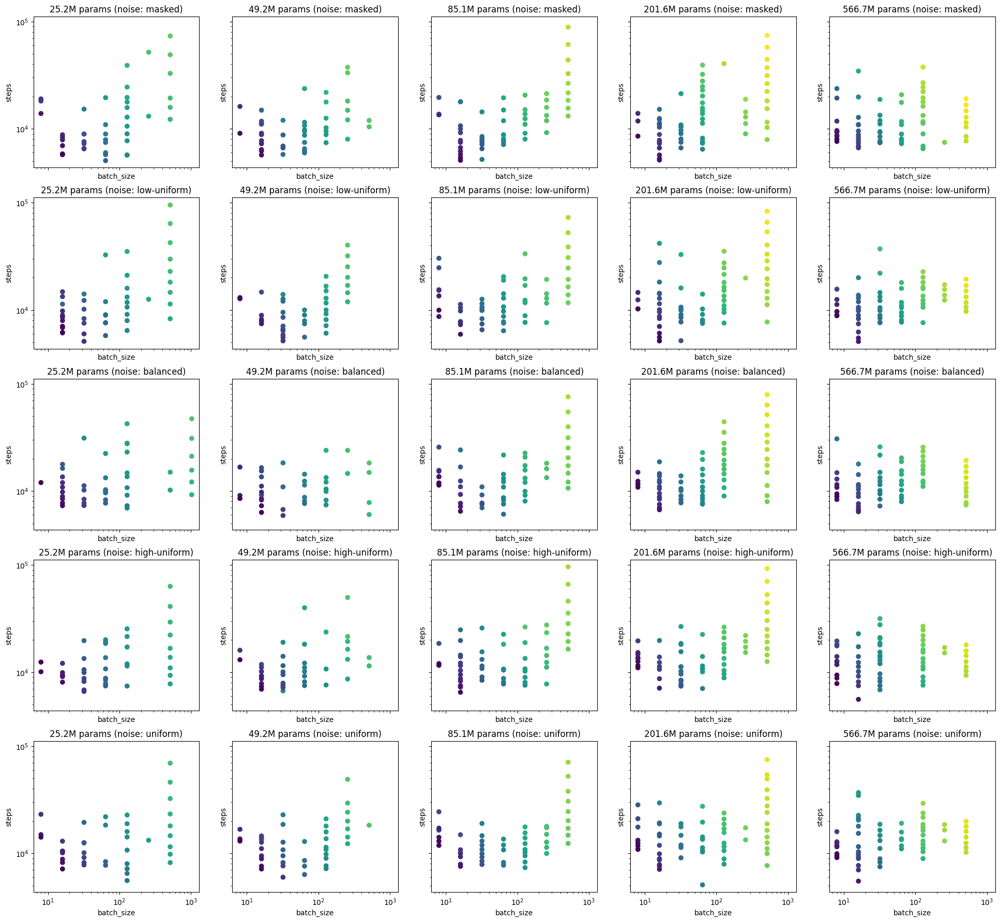

In [11]:
df_ = loss_df
df_ = df_.loc[df_["batch_size"] < 1024]
df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "non_emb_params", "target_loss"])["tokens"].idxmin()]
# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "non_emb_params", "tokens"])["target_loss"].idxmin()]
df_ = df_.loc[(df_["steps"] <= 100000) & (df_["steps"] > 5000)]

def sigmoid(x):
    return 1 / (1 + np.exp(-x.clip(-10, 10)))

fig, axs = plt.subplots(5, len(df_["non_emb_params"].unique()), figsize=(24, 22), sharex=True, sharey=True)

vmin, vmax = df_["target_loss"].min(), df_["target_loss"].max()

for i, (params, dfi) in enumerate(df_.groupby("non_emb_params")):
    for j, (hybrid_mixing_shift, dfj) in enumerate(dfi.groupby("hybrid_mixing_shift")):
        ax = axs[j, i]
        # ax.scatter(dfj["batch_size"], dfj["steps"], c=sigmoid(dfj["hybrid_mixing_shift"]))
        ax.scatter(dfj["batch_size"], dfj["steps"], c=dfj["target_loss"], cmap="viridis_r", vmin=vmin, vmax=vmax)

        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_xlabel("batch_size")
        ax.set_ylabel("steps")
        ax.set_title(f"{params/1e6:.1f}M params (noise: {get_noise_label(hybrid_mixing_shift)})")

In [12]:
scaling_laws = {}
fit_in_logspace = False


def hypothesis1(P, D, a, alpha, b, beta, E):
    return E + a * P**-alpha + b * D**-beta

for i, (hybrid_mixing_shift, dfi) in enumerate(df_.groupby("hybrid_mixing_shift")):
    P1, D1, L1 = dfi["non_emb_params"].values, dfi["tokens"].values, dfi["target_loss"].values

    transform = lambda x: x
    if fit_in_logspace:
        transform = np.log

    def base_resid(f, y, p):
        return transform(f(*p)) - transform(y)

    resid1 = functools.partial(base_resid, functools.partial(hypothesis1, P1, D1), L1)
    
    p1_0 = (1.0,) * 5

    sol1 = least_squares(resid1, p1_0, bounds=(1e-8, np.inf), loss="huber")

    print(f"{get_noise_label(hybrid_mixing_shift):20s}: a={sol1.x[0]:.3g},\talpha={sol1.x[1]:.3g},\tb={sol1.x[2]:.3g},\tbeta={sol1.x[3]:.3g},\tE={sol1.x[4]:.3g}")

    scaling_laws[hybrid_mixing_shift] = {
        "func": hypothesis1,
        "resid": resid1,
        "args": (P1, D1),
        "y": L1,
        "p": sol1.x,
    }


masked              : a=52.2,	alpha=0.269,	b=644,	beta=0.314,	E=2.28
low-uniform         : a=40.2,	alpha=0.25,	b=448,	beta=0.293,	E=2.24
balanced            : a=38.6,	alpha=0.247,	b=355,	beta=0.279,	E=2.21
high-uniform        : a=12.3,	alpha=0.159,	b=378,	beta=0.283,	E=1.98
uniform             : a=8.48,	alpha=0.121,	b=369,	beta=0.281,	E=1.74


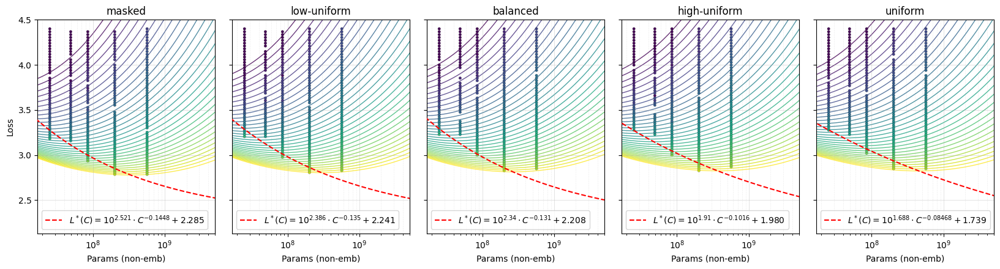

In [13]:
fig, axs = plt.subplots(1, 5, figsize=(17, 4.5), sharex=True, sharey="row")

flop_targets = np.logspace(17, np.log10(2e20), 32)

def color(x):
    cmap = plt.get_cmap("viridis")
    norm = plt.Normalize(vmin=np.log(flop_targets).min(), vmax=np.log(flop_targets).max())
    return cmap(norm(np.log(x)))

for i, (hybrid_mixing_shift, scaling_law) in enumerate(scaling_laws.items()):
    ax = axs[i]
    for flops in flop_targets:
        params = np.logspace(7, 10, 100)
        tokens = flops / (6 * params)

        loss = scaling_law["func"](params, tokens, *scaling_law["p"])
        ax.plot(params, loss, color=color(flops), alpha=0.8, zorder=1, linewidth=1.0)

        batch_size = np.logspace(3, 7, 100)
        steps = flops / (6 * params[:, None] * batch_size[None, :])

        # loss = scaling_law["hypothesis3"]["func"](params[:, None], steps, batch_size[None, :], *scaling_law["hypothesis3"]["p"])
        # opt_loss = loss.min(axis=1)

        # opt_idx = loss.argmin()
        # ax.plot(params[opt_idx], loss[opt_idx], ".", color="red")

    dfi = df_.loc[df_["hybrid_mixing_shift"] == hybrid_mixing_shift]
    xs = dfi["non_emb_params"]
    ys = dfi["target_loss"]
    c = dfi["tokens"] * xs * 6
    ax.scatter(xs, ys, c=np.log(c), cmap="viridis", vmin=np.log(flop_targets.min()), vmax=np.log(flop_targets.max()), edgecolor=(0, 0, 0, 0.3), linewidth=0.5, s=10, zorder=2)

    a, alpha, b, beta, E = scaling_law["p"]
    C_star_a = (alpha + beta) * (a/beta)**(beta/(alpha + beta)) * (b/alpha)**(alpha/(alpha + beta))
    C_star_alpha = (-(alpha*beta)/(alpha + beta))
    L_star_P = E + a*(alpha + beta)/beta * params**(-alpha)
    ax.plot(params, L_star_P, linestyle="--", color="red", label="$L^*(C) = 10^{{{:.4g}}} \\cdot C^{{{:.4g}}} + {:.3f}$".format(np.log10(C_star_a), C_star_alpha, E), zorder=3)

    ax.set_title(f"{get_noise_label(hybrid_mixing_shift)}")
    ax.set_xscale("log")
    # ax.set_yscale("log")
    ax.set_ylim(None, 4.5)
    ax.set_xlim(1.7e7, 5e9)
    ax.legend()


    ax.grid(True, which="major", linestyle="-", linewidth=0.5, alpha=0.5, zorder=0)
    ax.grid(True, which="minor", linestyle="--", linewidth=0.5, alpha=0.2, zorder=0)

for ax in axs.flatten():
    ax.set_xlabel("Params (non-emb)")

axs[0].set_ylabel("Loss")

fig.tight_layout(w_pad=-2.0)
fig.show()
fig.savefig("plots/scaling_laws.pdf", dpi=300, bbox_inches="tight")

masked: $L^*(C) = 10^{2.521} \cdot C^{-0.1448} + 2.285$
low-uniform: $L^*(C) = 10^{2.386} \cdot C^{-0.135} + 2.241$
balanced: $L^*(C) = 10^{2.34} \cdot C^{-0.131} + 2.208$
high-uniform: $L^*(C) = 10^{1.91} \cdot C^{-0.1016} + 1.980$
uniform: $L^*(C) = 10^{1.688} \cdot C^{-0.08468} + 1.739$


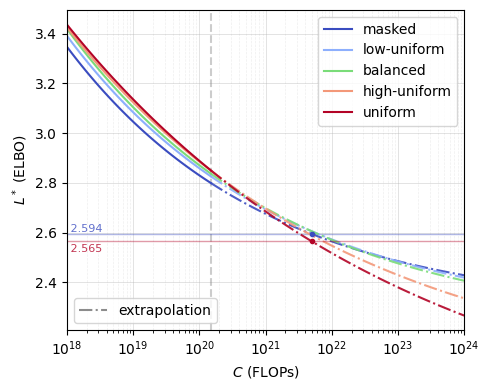

In [169]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

intra_flops = np.logspace(18, np.log10(1.5e20), 50)
extra_flops = np.logspace(np.log10(1.5e20), 24, 50)
flops = np.logspace(18, 24, 100)

idx = np.argmin(np.abs(flops - 1.5e20))

ax.axvline(x=1.5e20, color="gray", linestyle="--", alpha=0.4)
ax.plot([], [], linestyle="-.", color="gray", alpha=0.9, label="extrapolation")

for i, (hybrid_mixing_shift, scaling_law) in enumerate(scaling_laws.items()):
    color = colors[hybrid_mixing_shift]

    a, alpha, b, beta, E = scaling_law["p"]
    C_star_a = (alpha + beta) * (a/beta)**(beta/(alpha + beta)) * (b/alpha)**(alpha/(alpha + beta))
    C_star_alpha = (-(alpha*beta)/(alpha + beta))

    L_star_C_intra = E + C_star_a * (intra_flops/6)**C_star_alpha
    L_star_C_extra = E + C_star_a * (extra_flops/6)**C_star_alpha


    if hybrid_mixing_shift == -1000.0:
        C = 5e21
        L = E + C_star_a * (C/6)**C_star_alpha
        ax.plot([C], [L], ".", color=np.array(color)/255.0, zorder=10)
        ax.axhline(y=L, color=np.array(color)/255.0, linestyle="-", alpha=0.4, linewidth=1.0)
        ax.text(1e18, L, f" {L:.3f}", fontsize=8, va="bottom", ha="left", color=np.array(color)/255.0, alpha=0.8)

    
    if hybrid_mixing_shift == 1000.0:
        C = 5e21
        L = E + C_star_a * (C/6)**C_star_alpha
        ax.plot([C], [L], ".", color=np.array(color)/255.0, zorder=10)
        ax.axhline(y=L, color=np.array(color)/255.0, linestyle="-", alpha=0.4, linewidth=1.0)
        ax.text(1e18, L*0.996, f" {L:.3f}", fontsize=8, va="top", ha="left", color=np.array(color)/255.0, alpha=0.8)

    label = get_noise_label(hybrid_mixing_shift)
    ax.plot(intra_flops, L_star_C_intra, linestyle="-", color=np.array(color)/255.0, label=label)
    ax.plot(extra_flops, L_star_C_extra, linestyle="-.", color=np.array(color)/255.0, alpha=0.9)

    print(get_noise_label(hybrid_mixing_shift) + ": $L^*(C) = 10^{{{:.4g}}} \\cdot C^{{{:.4g}}} + {:.3f}$".format(np.log10(C_star_a), C_star_alpha, E))


handles, labels = ax.get_legend_handles_labels()
trend_mask = [lbl.startswith("extrapolation") for lbl in labels]
trend_handles = [h for h, m in zip(handles, trend_mask) if m]
trend_labels = [l for l, m in zip(labels, trend_mask) if m]
main_handles = [h for h, m in zip(handles, trend_mask) if not m]
main_labels = [l for l, m in zip(labels, trend_mask) if not m]

leg_main = ax.legend(main_handles, main_labels, loc="upper right")
ax.add_artist(leg_main)
ax.legend(trend_handles, trend_labels, loc="lower left")

ax.set_xscale("log")
# ax.set_yscale("log")
# ax.legend()

ax.grid(True, which="major", linestyle="-", linewidth=0.5, alpha=0.5)
ax.grid(True, which="minor", linestyle="--", linewidth=0.5, alpha=0.2)

ax.set_xlim(1e18, 1e24)

ax.set_xlabel("$C$ (FLOPs)")
ax.set_ylabel("$L^*$ (ELBO)")
fig.tight_layout()
fig.savefig("plots/compute_optimal_frontier.pdf", bbox_inches="tight")

masked: P^* \propto C^{0.538}, D^* \propto C^{0.462}
low-uniform: P^* \propto C^{0.539}, D^* \propto C^{0.461}
balanced: P^* \propto C^{0.531}, D^* \propto C^{0.469}
high-uniform: P^* \propto C^{0.64}, D^* \propto C^{0.36}
uniform: P^* \propto C^{0.699}, D^* \propto C^{0.301}


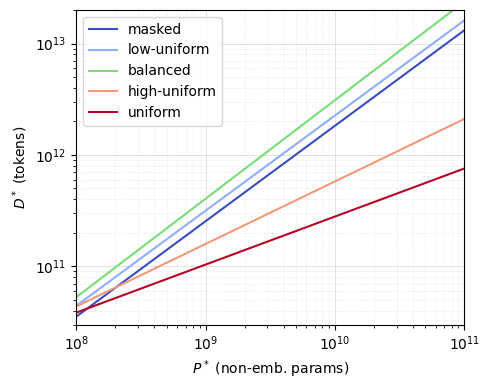

In [102]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

for hybrid_mixing_shift, scaling_law in scaling_laws.items():
    color = colors[hybrid_mixing_shift]

    a, alpha, b, beta, E = scaling_law["p"]
    P_star_a, P_star_alpha = ((a*alpha)/(b*beta))**(1/(alpha + beta)), (beta/(alpha + beta))
    D_star_a, D_star_alpha = ((b*beta)/(a*alpha))**(1/(alpha + beta)), (alpha/(alpha + beta))

    flops = np.logspace(18, 26, 100)
    params = P_star_a * (flops/6)**P_star_alpha
    tokens = D_star_a * (flops/6)**D_star_alpha

    # label = f"$P^* \\propto C^{{{P_star_alpha:.3g}}}$\n$D^* \\propto C^{{{D_star_alpha:.3g}}}$"
    label = get_noise_label(hybrid_mixing_shift)
    ax.plot(params, tokens, color=np.array(color)/255.0, label=label)


    print(f"{get_noise_label(hybrid_mixing_shift)}: P^* \\propto C^{{{P_star_alpha:.3g}}}, D^* \\propto C^{{{D_star_alpha:.3g}}}")



ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlim(1e8, 1e11)
ax.set_ylim(3e10, 2e13)

ax.grid(True, which="major", linestyle="-", linewidth=0.5, alpha=0.5)
ax.grid(True, which="minor", linestyle="--", linewidth=0.5, alpha=0.2)

ax.set_xlabel("$P^*$ (non-emb. params)")
ax.set_ylabel("$D^*$ (tokens)")
# ax.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), labelspacing=1.0)
ax.legend()
fig.tight_layout()
fig.savefig("plots/opt_params_tokens.pdf", bbox_inches="tight")

masked: P^* \propto C^{0.538}, D^* \propto C^{0.462}
low-uniform: P^* \propto C^{0.539}, D^* \propto C^{0.461}
balanced: P^* \propto C^{0.531}, D^* \propto C^{0.469}
high-uniform: P^* \propto C^{0.64}, D^* \propto C^{0.36}
uniform: P^* \propto C^{0.699}, D^* \propto C^{0.301}


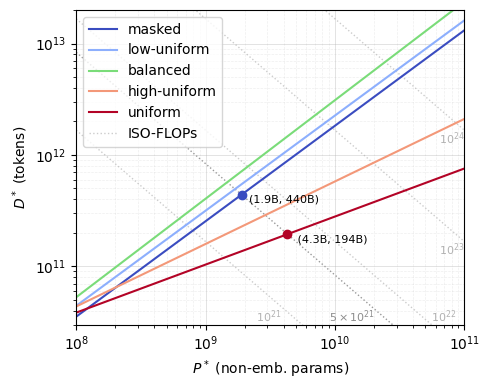

In [165]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

trained_flops = 5e21

for hybrid_mixing_shift, scaling_law in scaling_laws.items():
    color = colors[hybrid_mixing_shift]


    a, alpha, b, beta, E = scaling_law["p"]
    P_star_a, P_star_alpha = ((a*alpha)/(b*beta))**(1/(alpha + beta)), (beta/(alpha + beta))
    D_star_a, D_star_alpha = ((b*beta)/(a*alpha))**(1/(alpha + beta)), (alpha/(alpha + beta))

    flops = np.logspace(18, 26, 100)
    params = P_star_a * (flops/6)**P_star_alpha
    tokens = D_star_a * (flops/6)**D_star_alpha

    # label = f"$P^* \\propto C^{{{P_star_alpha:.3g}}}$\n$D^* \\propto C^{{{D_star_alpha:.3g}}}$"
    label = get_noise_label(hybrid_mixing_shift)
    ax.plot(params, tokens, color=np.array(color)/255.0, label=label)
    
    if hybrid_mixing_shift == -1000.0:
        P = P_star_a * (trained_flops/6)**P_star_alpha
        D = D_star_a * (trained_flops/6)**D_star_alpha
        ax.plot([P], [D], "o", color=np.array(color)/255.0)
        ax.text(P, D, f"  ({P/1e9:.1f}B, {D/1e9:.0f}B)", fontsize=8, va="top", ha="left")

    
    if hybrid_mixing_shift == 1000.0:
        P = P_star_a * (trained_flops/6)**P_star_alpha
        D = D_star_a * (trained_flops/6)**D_star_alpha
        ax.plot([P], [D], "o", color=np.array(color)/255.0)
        ax.text(P, D, f"   ({P/1e9:.1f}B, {D/1e9:.0f}B)", fontsize=8, va="top", ha="left")

    print(f"{get_noise_label(hybrid_mixing_shift)}: P^* \\propto C^{{{P_star_alpha:.3g}}}, D^* \\propto C^{{{D_star_alpha:.3g}}}")

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlim(1e8, 1e11)
ax.set_ylim(3e10, 2e13)

iso_flop_values = [1e21, 1e22, 1e23, 1e24]
x_min, x_max = ax.get_xlim()
y_min, y_max = ax.get_ylim()
x_line = np.logspace(np.log10(x_min), np.log10(x_max), 200)
for i, C in enumerate(iso_flop_values):
    y_line = (C/6.0) / x_line
    label = "ISO-FLOPs" if i == 0 else None
    ax.plot(x_line, y_line, linestyle=":", color="gray", alpha=0.4, linewidth=1.0, zorder=0, label=label)
    x_label = x_max
    y_label = (C/6.0)/x_label
    ha = "right"
    va = "top"
    if y_label < y_min:
        va = "bottom"
        y_label = y_min
        x_label = (C/6.0)/y_label
        if C == 1e21:
            ha = "right"
            x_label = x_label * 0.7
        else:
            ha = "left"
    # if not (y_min < y_label < y_max):
    #     x_label = x_min*1.5
    #     y_label = (C/6.0)/x_label
    ax.text(x_label, y_label, f"$10^{{{int(np.log10(C))}}}$", fontsize=8, va=va, ha=ha, color="gray", alpha=0.6)

iso_flop_values = [5e21]
for i, C in enumerate(iso_flop_values):
    y_line = (C/6.0) / x_line
    label = None
    ax.plot(x_line, y_line, linestyle=":", color="gray", alpha=0.8, linewidth=1.0, zorder=0, label=label)

    ha = "right"
    va = "bottom"
    y_label = y_min
    x_label = (C/6.0)/y_label * 0.73
    # if not (y_min < y_label < y_max):
    #     x_label = x_min*1.5
    #     y_label = (C/6.0)/x_label
    ax.text(x_label, y_label, "$5 \\times 10^{21}$", fontsize=8, va=va, ha=ha, color="gray", alpha=0.9)


ax.grid(True, which="major", linestyle="-", linewidth=0.5, alpha=0.5)
ax.grid(True, which="minor", linestyle="--", linewidth=0.5, alpha=0.2)

ax.set_xlabel("$P^*$ (non-emb. params)")
ax.set_ylabel("$D^*$ (tokens)")
# ax.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), labelspacing=1.0)
ax.legend(loc="upper left")
fig.tight_layout()
fig.savefig("plots/opt_params_tokens.pdf", bbox_inches="tight")


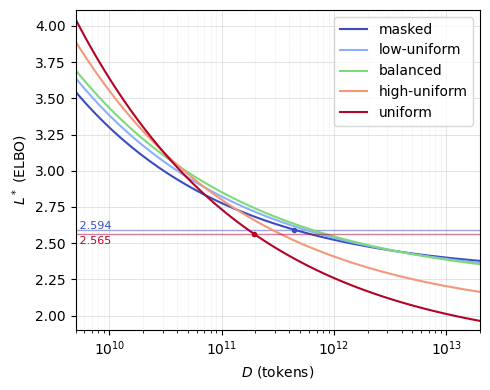

In [159]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

tokens = np.logspace(np.log10(1e9), np.log10(2e13), 100)

for hybrid_mixing_shift, scaling_law in scaling_laws.items():
    color = colors[hybrid_mixing_shift]

    a, alpha, b, beta, E = scaling_law["p"]
    # P_star_a, P_star_alpha = ((a*alpha)/(b*beta))**(1/(alpha + beta)), (beta/(alpha + beta))
    # D_star_a, D_star_alpha = ((b*beta)/(a*alpha))**(1/(alpha + beta)), (alpha/(alpha + beta))

    # flops = 6 * tokens * params
    # params = P_star_a * (flops/6)**P_star_alpha
    # tokens = D_star_a * (flops/6)**D_star_alpha
    L_star = E + ((alpha+beta)/alpha)*b * tokens**(-beta)

    # label = f"$P^* \\propto C^{{{P_star_alpha:.3g}}}$\n$D^* \\propto C^{{{D_star_alpha:.3g}}}$"
    label = get_noise_label(hybrid_mixing_shift)
    ax.plot(tokens, L_star, color=np.array(color)/255.0, label=label)

    if hybrid_mixing_shift == -1000.0:
        D = 440 * 1e9
        L = E + ((alpha+beta)/alpha)*b * D**(-beta)
        ax.plot([D], [L], ".", color=np.array(color)/255.0)
        ax.axhline(y=L, color=np.array(color)/255.0, linestyle="-", alpha=0.5, linewidth=1.0)
        # ax.text(5e9, L, f" {L:.3f}", fontsize=8, va="bottom", ha="left")
        ax.text(5e9, L*0.995, f" {L:.3f}", fontsize=8, va="bottom", ha="left", color=np.array(color)/255.0)

    
    if hybrid_mixing_shift == 1000.0:
        D = 194 * 1e9
        L = E + ((alpha+beta)/alpha)*b * D**(-beta)
        ax.plot([D], [L], ".", color=np.array(color)/255.0)
        ax.axhline(y=L, color=np.array(color)/255.0, linestyle="-", alpha=0.5, linewidth=1.0)
        # ax.text(5e9, L, f" {L:.3f}", fontsize=8, va="top", ha="left")
        ax.text(5e9, L*0.995, f" {L:.3f}", fontsize=8, va="top", ha="left", color=np.array(color)/255.0)


    # print(f"{get_noise_label(hybrid_mixing_shift)}: P^* \\propto C^{{{P_star_alpha:.3g}}}, D^* \\propto C^{{{D_star_alpha:.3g}}}")

ax.set_xscale("log")
# ax.set_yscale("log")
ax.set_xlim(5e9, 2e13)
ax.set_ylim(1.9, 4.11)

ax.grid(True, which="major", linestyle="-", linewidth=0.5, alpha=0.5)
ax.grid(True, which="minor", linestyle="--", linewidth=0.5, alpha=0.2)

ax.set_xlabel("$D$ (tokens)")
ax.set_ylabel("$L^*$ (ELBO)")
# ax.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), labelspacing=1.0)
ax.legend()
fig.tight_layout()
fig.savefig("plots/opt_loss_vs_tokens.pdf", bbox_inches="tight")

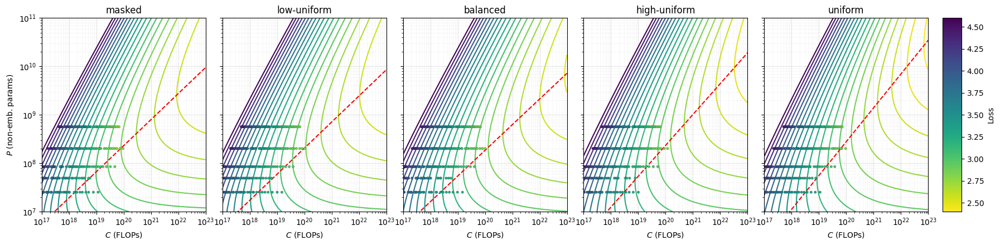

In [64]:
fig, axs = plt.subplots(1, 5, figsize=(17, 4.5), sharex=True, sharey="row")

vmin, vmax = 2.4, 4.6
cmap = "viridis_r"
norm = plt.Normalize(vmin=vmin, vmax=vmax)

flops = np.logspace(17, 23, 100)
params = np.logspace(7, 11, 100)
X, Y = np.meshgrid(flops, params)
tokens = X / (6 * Y)

for i, (hybrid_mixing_shift, scaling_law) in enumerate(scaling_laws.items()):
    ax = axs[i]
    a, alpha, b, beta, E = scaling_law["p"]
    loss = E + a * Y**-alpha + b * tokens**-beta

    ax.contour(X, Y, loss, levels=np.logspace(np.log10(vmin), np.log10(vmax), 20), cmap=cmap, norm=norm)

    p_opt = ((alpha*a)/(beta*b))**(1/(alpha+beta)) * (flops/6)**(beta/(alpha+beta))
    expo = beta/(alpha+beta)
    ax.plot(flops, p_opt, linestyle="--", color="red", label="$P^* \\propto C^{{{:.3g}}}$".format(expo))

    dfi = df_.loc[df_["hybrid_mixing_shift"] == hybrid_mixing_shift]
    ps, ts, ls = dfi["non_emb_params"], dfi["tokens"], dfi["target_loss"]
    ax.scatter(6*ps*ts, ps, c=ls, cmap=cmap, norm=norm, edgecolor=(0,0,0,0.3), linewidth=0.5, s=10, zorder=2)

    ax.set_xscale("log"); ax.set_yscale("log")
    ax.set_title(get_noise_label(hybrid_mixing_shift))
    ax.set_ylim(1e7, 1e11); ax.set_xlim(1e17, 1e23)
    if i == 0: ax.set_ylabel("$P$ (non-emb. params)")
    ax.set_xlabel("$C$ (FLOPs)")
    ax.grid(True, which="major", linestyle="-", linewidth=0.5, alpha=0.5)
    ax.grid(True, which="minor", linestyle="--", linewidth=0.5, alpha=0.2)

fig.tight_layout(w_pad=-0.1)

box = axs[-1].get_position()
cax_w, pad = 0.02, 0.015
cax = fig.add_axes([box.x0 + box.width + pad, box.y0, cax_w, box.height])
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
fig.colorbar(sm, cax=cax, label="Loss")
cax.yaxis.set_ticks_position('right'); cax.yaxis.set_label_position('right')

fig.savefig("plots/params_vs_flops.pdf", bbox_inches="tight")


In [16]:
print("1.5b: 200B tokens")
print("7b: 600B tokens")

1.5b: 200B tokens
7b: 600B tokens


In [17]:
df_.groupby(["batch_size"])["lr"].unique()

batch_size
8                  [0.1, 0.2, 0.3]
16            [0.3, 0.2, 0.5, 0.1]
32      [0.5, 0.3, 0.1, 0.2, 0.25]
64            [0.5, 0.3, 1.0, 0.2]
128           [0.5, 0.3, 1.0, 0.4]
256                     [0.5, 1.0]
512                [0.5, 1.0, 2.0]
1024                         [2.0]
Name: lr, dtype: object

In [18]:
scaling_laws = {}
fit_in_logspace = True


def hypothesis1(P, D, a, alpha, b, beta, E):
    return E + a * P**-alpha + b * D**-beta

def hypothesis2(P, S, B, a, alpha, b, beta, S_min, S_exp, B_min, B_exp, E):
    S_hat = (S / S_min)**S_exp
    B_hat = (B / B_min)**B_exp
    return E + a * P**-alpha + b * (1.0 + 1.0 / ((S_hat - 1)*(B_hat - 1)))**-beta

def hypothesis3(P, S, B, L, P_min, P_exp, S_min, S_exp, B_min, B_exp, L_min, L_exp, E):
    P_hat = (P / P_min)**P_exp
    S_hat = (S / S_min)**S_exp
    B_hat = (B / B_min)**B_exp
    L_hat = (L / L_min)**L_exp
    return (P_hat - 1)*(S_hat - 1)*(B_hat - 1)*(L_hat - 1) * E

def hypothesis3a(P, S, B, P_min, P_exp, S_min, S_exp, B_min, B_exp, L_min, L_exp, E):
    P_hat = (P / P_min)**P_exp
    S_hat = (S / S_min)**S_exp
    B_hat = (B / B_min)**B_exp
    return L_min * (1.0 + 1.0 / (E*(P_hat - 1)*(S_hat - 1)*(B_hat - 1)))**(1.0 / L_exp)

for i, (hybrid_mixing_shift, dfi) in enumerate(loss_df.groupby("hybrid_mixing_shift")):
    dfi1 = dfi.loc[dfi.groupby(["non_emb_params", "target_loss"])["tokens"].idxmin()]
    # dfi1 = dfi.loc[dfi.groupby(["non_emb_params", "tokens"])["target_loss"].idxmin()]
    dfi1 = dfi1.loc[(dfi1["steps"] <= 100000) & (dfi1["steps"] > 5000)]
    dfi2 = dfi.loc[dfi.groupby(["non_emb_params", "batch_size", "target_loss"])["steps"].idxmin()]
    dfi3 = dfi2

    P1, D1, L1 = dfi1["non_emb_params"].values, dfi1["tokens"].values, dfi1["target_loss"].values
    P2, S2, B2, L2 = dfi2["non_emb_params"].values, dfi2["steps"].values, dfi2["batch_size"].values, dfi2["target_loss"].values
    P3, S3, B3, L3 = dfi3["non_emb_params"].values, dfi3["steps"].values, dfi3["batch_size"].values, dfi3["target_loss"].values

    transform = lambda x: x
    if fit_in_logspace:
        transform = np.log

    def base_resid(f, y, p):
        return transform(f(*p)) - transform(y)

    resid1 = functools.partial(base_resid, functools.partial(hypothesis1, P1, D1), L1)
    resid2 = functools.partial(base_resid, functools.partial(hypothesis2, P2, S2, B2), L2)
    resid3 = functools.partial(base_resid, functools.partial(hypothesis3, P3, S3, B3, L3), 1.0)
    resid3a = functools.partial(base_resid, functools.partial(hypothesis3a, P3, S3, B3), L3)
    
    p1_0 = (1.0,) * 5
    p2_0 = (1.0,) * 9
    p3_0 = (1.0,) * 9

    sol1 = least_squares(resid1, p1_0, bounds=(1e-8, np.inf))
    sol2 = least_squares(resid2, p2_0, bounds=(1e-8, np.inf))
    sol3 = least_squares(resid3, p3_0, bounds=(1e-8, np.inf))
    sol3a = least_squares(resid3a, p3_0, bounds=(1e-8, np.inf))

    scaling_laws[hybrid_mixing_shift] = {
        "hypothesis1": {
            "func": hypothesis1,
            "resid": resid1,
            "args": (P1, D1),
            "y": L1,
            "p": sol1.x,
        },
        "hypothesis2": {
            "func": hypothesis2,
            "resid": resid2,
            "args": (P2, S2, B2),
            "y": L2,
            "p": sol2.x,
        },
        "hypothesis3": {
            "func": hypothesis3a,
            "resid": resid3,
            "args": (P3, S3, B3),
            "y": L3,
            "p": sol3.x,
        },
        "hypothesis3a": {
            "func": hypothesis3a,
            "resid": resid3a,
            "args": (P3, S3, B3),
            "y": L3,
            "p": sol3a.x,
        },
    }


/tmp/ipykernel_3615132/3491812495.py:42: RuntimeWarning: invalid value encountered in log
  return transform(f(*p)) - transform(y)


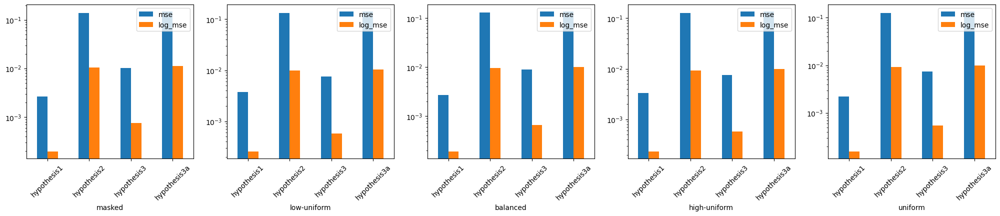

In [19]:
data = []
for hybrid_mixing_shift, scaling_law in scaling_laws.items():
    for hypothesis, item in scaling_law.items():
        L_pred = item["func"](*item["args"], *item["p"])
        mse = np.mean((L_pred - item["y"])**2)
        log_mse = np.mean((np.log(L_pred) - np.log(item["y"]))**2)
        data.append({
            "hybrid_mixing_shift": hybrid_mixing_shift,
            "hypothesis": hypothesis,
            "mse": mse,
            "log_mse": log_mse,
        })

df_ = pd.DataFrame(data)

fig, axs = plt.subplots(1, 5, figsize=(25, 4))

for i, (hybrid_mixing_shift, dfi) in enumerate(df_.groupby("hybrid_mixing_shift")):
    ax = axs[i]
    dfi.drop(columns=["hybrid_mixing_shift"]).plot.bar(x="hypothesis", ax=ax, rot=45)
    ax.set_xlabel(get_noise_label(hybrid_mixing_shift))
    ax.set_yscale("log")

In [20]:
for hybrid_mixing_shift, scaling_law in scaling_laws.items():
    print(f"{get_noise_label(hybrid_mixing_shift)}")
    print("  * hypothesis1: a={:.3g}, alpha={:.3g}, b={:.3g}, beta={:.3g}, E={:.3g}".format(*scaling_law["hypothesis1"]["p"]))
    print("  * hypothesis2: a={:.3g}, alpha={:.3g}, b={:.3g}, beta={:.3g}, S_min={:.3g}, S_exp={:.3g}, B_min={:.3g}, B_exp={:.3g}, E={:.3g}".format(*scaling_law["hypothesis2"]["p"]))
    print("  * hypothesis3: P_min={:.3g}, P_exp={:.3g}, S_min={:.3g}, S_exp={:.3g}, B_min={:.3g}, B_exp={:.3g}, L_min={:.3g}, L_exp={:.3g}, E={:.3g}".format(*scaling_law["hypothesis3"]["p"]))
    print("  * hypothesis3a: P_min={:.3g}, P_exp={:.3g}, S_min={:.3g}, S_exp={:.3g}, B_min={:.3g}, B_exp={:.3g}, L_min={:.3g}, L_exp={:.3g}, E={:.3g}".format(*scaling_law["hypothesis3a"]["p"]))


masked
  * hypothesis1: a=46.2, alpha=0.256, b=646, beta=0.314, E=2.23
  * hypothesis2: a=122, alpha=0.332, b=0.0259, beta=0.801, S_min=0.909, S_exp=3.68, B_min=0.907, B_exp=2, E=3.38
  * hypothesis3: P_min=2.36e-05, P_exp=0.0044, S_min=0.777, S_exp=0.00372, B_min=1.15e-08, B_exp=0.0767, L_min=0.216, L_exp=1.14, E=1.84
  * hypothesis3a: P_min=1, P_exp=1.01, S_min=1, S_exp=1, B_min=1, B_exp=1, L_min=3.67, L_exp=1, E=1
low-uniform
  * hypothesis1: a=51.4, alpha=0.262, b=467, beta=0.295, E=2.23
  * hypothesis2: a=288, alpha=0.388, b=3.58e-05, beta=0.912, S_min=0.912, S_exp=3.68, B_min=0.91, B_exp=2, E=3.47
  * hypothesis3: P_min=2.24e-08, P_exp=0.0175, S_min=3.18, S_exp=0.00462, B_min=0.000569, B_exp=0.0412, L_min=0.38, L_exp=1.32, E=2.55
  * hypothesis3a: P_min=1, P_exp=1.37, S_min=1, S_exp=1, B_min=1, B_exp=1, L_min=3.7, L_exp=1, E=1
balanced
  * hypothesis1: a=41.8, alpha=0.247, b=383, beta=0.283, E=2.18
  * hypothesis2: a=48.7, alpha=0.28, b=0.00934, beta=0.914, S_min=0.914, S_exp=3.6

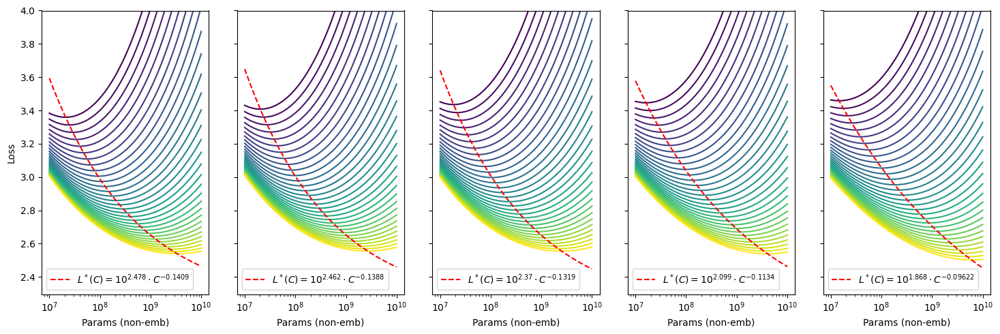

In [21]:
fig, axs = plt.subplots(1, 5, figsize=(15, 5), sharex=False, sharey="row")

flop_targets = np.logspace(18, 22, 32)

def color(x):
    cmap = plt.get_cmap("viridis")
    norm = plt.Normalize(vmin=np.log(flop_targets).min(), vmax=np.log(flop_targets).max())
    return cmap(norm(np.log(x)))

for i, (hybrid_mixing_shift, scaling_law) in enumerate(scaling_laws.items()):
    for flops in flop_targets:
        params = np.logspace(7, 10, 100)
        tokens = flops / (6 * params)

        loss = scaling_law["hypothesis1"]["func"](params, tokens, *scaling_law["hypothesis1"]["p"])
        axs[i].plot(params, loss, color=color(flops), alpha=1.0)

        batch_size = np.logspace(3, 7, 100)
        steps = flops / (6 * params[:, None] * batch_size[None, :])

        # loss = scaling_law["hypothesis3"]["func"](params[:, None], steps, batch_size[None, :], *scaling_law["hypothesis3"]["p"])
        # opt_loss = loss.min(axis=1)

        # opt_idx = loss.argmin()
        # axs[i].plot(params[opt_idx], loss[opt_idx], ".", color="red")

    a, alpha, b, beta, E = scaling_law["hypothesis1"]["p"]
    C_star_a = (alpha + beta) * (a/beta)**(beta/(alpha + beta)) * (b/alpha)**(alpha/(alpha + beta))
    C_star_alpha = (-(alpha*beta)/(alpha + beta))
    L_star_P = E + a*(alpha + beta)/beta * params**(-alpha)
    axs[i].plot(params, L_star_P, linestyle="--", color="red", label="$L^*(C) = 10^{{{:.4g}}} \\cdot C^{{{:.4g}}}$".format(np.log10(C_star_a), C_star_alpha))

    axs[i].set_xscale("log")
    # axs[i].set_yscale("log")
    axs[i].set_ylim(None, 4)
    axs[i].legend()


for ax in axs.flatten():
    ax.set_xlabel("Params (non-emb)")

axs[0].set_ylabel("Loss")

fig.tight_layout()

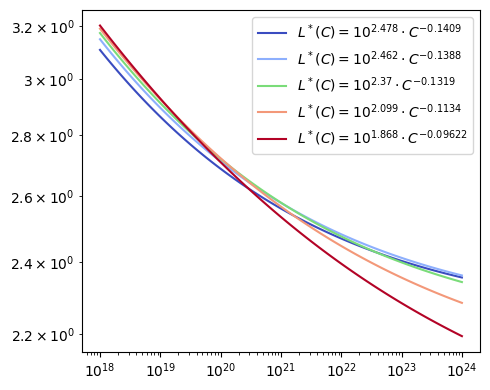

In [22]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

flop_targets = np.logspace(18, 22, 32)

def color(x):
    cmap = plt.get_cmap("viridis")
    norm = plt.Normalize(vmin=np.log(flop_targets).min(), vmax=np.log(flop_targets).max())
    return cmap(norm(np.log(x)))

for i, (hybrid_mixing_shift, scaling_law) in enumerate(scaling_laws.items()):
    color = colors[hybrid_mixing_shift]

    a, alpha, b, beta, E = scaling_law["hypothesis1"]["p"]
    C_star_a = (alpha + beta) * (a/beta)**(beta/(alpha + beta)) * (b/alpha)**(alpha/(alpha + beta))
    C_star_alpha = (-(alpha*beta)/(alpha + beta))

    flops = np.logspace(18, 24, 100)
    L_star_C = E + C_star_a * flops**C_star_alpha
    ax.plot(flops, L_star_C, linestyle="-", color=np.array(color)/255.0, label="$L^*(C) = 10^{{{:.4g}}} \\cdot C^{{{:.4g}}}$".format(np.log10(C_star_a), C_star_alpha))

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.legend()

fig.tight_layout()

masked: P* = 0.00679 * C^{0.551}, D* = 147 * C^{0.449}
low-uniform: P* = 0.0154 * C^{0.53}, D* = 65.1 * C^{0.47}
balanced: P* = 0.0119 * C^{0.534}, D* = 84 * C^{0.466}
high-uniform: P* = 0.000726 * C^{0.601}, D* = 1.38e+03 * C^{0.399}
uniform: P* = 7.84e-05 * C^{0.654}, D* = 1.28e+04 * C^{0.346}


Text(0, 0.5, '$D^*$ (tokens)')

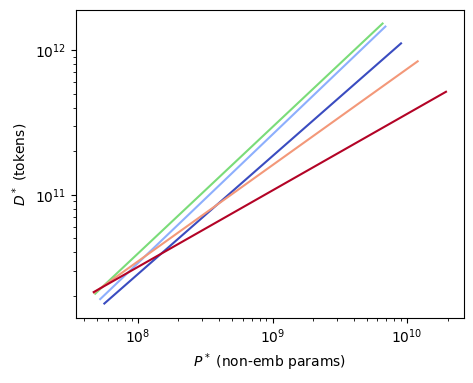

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

for hybrid_mixing_shift, scaling_law in scaling_laws.items():
    color = colors[hybrid_mixing_shift]

    a, alpha, b, beta, E = scaling_law["hypothesis1"]["p"]
    P_star_a, P_star_alpha = ((a*alpha)/(b*beta))**(1/(alpha + beta)), (beta/(alpha + beta))
    D_star_a, D_star_alpha = ((b*beta)/(a*alpha))**(1/(alpha + beta)), (alpha/(alpha + beta))

    flops = np.logspace(18, 22, 100)
    params = P_star_a * flops**P_star_alpha
    tokens = D_star_a * flops**D_star_alpha

    ax.plot(params, tokens, color=np.array(color)/255.0, label=get_noise_label(hybrid_mixing_shift))


    print(f"{get_noise_label(hybrid_mixing_shift)}: P* = {P_star_a:.3g} * C^{{{P_star_alpha:.3g}}}, D* = {D_star_a:.3g} * C^{{{D_star_alpha:.3g}}}")

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("$P^*$ (non-emb params)")
ax.set_ylabel("$D^*$ (tokens)")

MSE: 0.0003634
MSE: 0.000313
MSE: 0.0005226
MSE: 0.0002984
MSE: 0.0001744


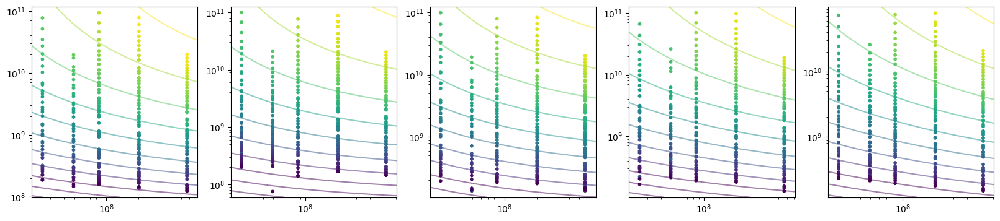

In [24]:
df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "non_emb_params", "target_loss"])["tokens"].idxmin()]

fig, axs = plt.subplots(1, 5, figsize=(20, 4))


vmin, vmax = df_["target_loss"].min(), df_["target_loss"].max()

for i, (hybrid_mixing_shift, dfi) in enumerate(df_.groupby("hybrid_mixing_shift")):
    ax = axs[i]
    x = dfi["non_emb_params"]
    y = dfi["tokens"]
    c = dfi["target_loss"]

    def power_law(x, y, a1, a2, b1, b2, E):
        return E + a1 * x**-a2 + b1 * y**-b2

    def resid(p):
        a1, a2, b1, b2, E = p
        return np.log(power_law(x, y, a1, a2, b1, b2, E)) - np.log(c)

    res = least_squares(resid, x0=[1.0, 0.1, 1.0, 1.0, 1.0], bounds=(1e-8, np.inf))
    a1, a2, b1, b2, E = res.x

    mse = np.mean(resid(res.x)**2)
    print(f"MSE: {mse:.4g}")

    pad = 0.1
    x_hat = np.logspace(np.log10(x.min())-pad, np.log10(x.max())+pad, 100)
    y_hat = np.logspace(np.log10(y.min())-pad, np.log10(y.max())+pad, 100)
    X, Y = np.meshgrid(x_hat, y_hat)
    Z = power_law(X, Y, a1, a2, b1, b2, E)

    ax.contour(X, Y, Z, levels=10, cmap="viridis_r", vmin=vmin, vmax=vmax, alpha=0.5)

    ax.scatter(x, y, c=c, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)
    ax.set_xscale("log")
    ax.set_yscale("log")

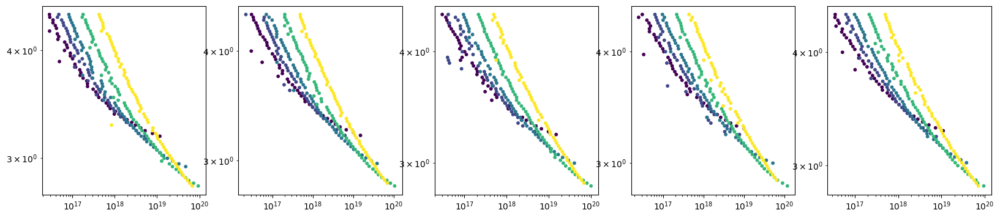

In [25]:
df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "non_emb_params", "target_loss"])["tokens"].idxmin()]

fig, axs = plt.subplots(1, 5, figsize=(20, 4))

for i, (hybrid_mixing_shift, dfi) in enumerate(df_.groupby("hybrid_mixing_shift")):
    ax = axs[i]
    ps = dfi["non_emb_params"]
    ts = dfi["tokens"]
    ls = dfi["target_loss"]

    flops = 6 * ps * ts
    x = flops
    y = ls


    ax.scatter(x, y, c=np.log(ps), s=10, cmap="viridis")
    ax.set_xscale("log")
    ax.set_yscale("log")

MSE: 0.0003634
MSE: 0.000313


MSE: 0.0005226
MSE: 0.0002984
MSE: 0.0001744


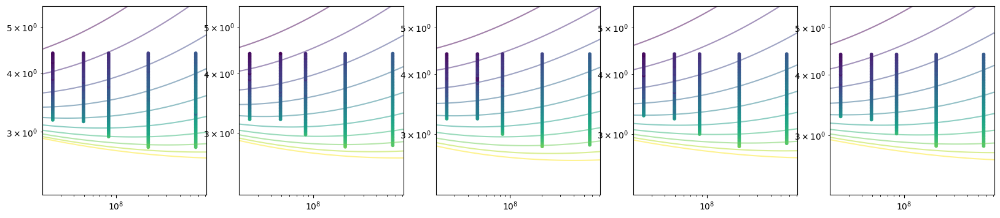

In [26]:
df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "non_emb_params", "target_loss"])["tokens"].idxmin()]

fig, axs = plt.subplots(1, 5, figsize=(20, 4))


flops = 6 * df_["non_emb_params"] * df_["tokens"]
vmin, vmax = flops.min(), 10*flops.max()


def color(x, cmap=plt.get_cmap("viridis")):
    norm = plt.Normalize(vmin=np.log(vmin), vmax=np.log(vmax))
    return cmap(norm(np.log(x)))

for i, (hybrid_mixing_shift, dfi) in enumerate(df_.groupby("hybrid_mixing_shift")):
    ax = axs[i]
    ps = dfi["non_emb_params"]
    ts = dfi["tokens"]
    ls = dfi["target_loss"]
    flops = 6 * ps * ts

    ax.scatter(ps, ls, c=np.log(flops), vmin=np.log(vmin), vmax=np.log(vmax), s=10, cmap="viridis")

    def power_law(x, y, a1, a2, b1, b2, E):
        return E + a1 * x**-a2 + b1 * y**-b2

    def resid(p):
        a1, a2, b1, b2, E = p
        return np.log(power_law(ps, ts, a1, a2, b1, b2, E)) - np.log(ls)

    res = least_squares(resid, x0=[1.0, 1.0, 1.0, 1.0, 1.0], bounds=(1e-8, np.inf))
    a1, a2, b1, b2, E = res.x

    mse = np.mean(resid(res.x)**2)
    print(f"MSE: {mse:.4g}")

    pad = 0.1
    x_hat = np.logspace(np.log10(ps.min())-pad, np.log10(ps.max())+pad, 100)
    y_hat = np.logspace(np.log10(ls.min())-pad, np.log10(ls.max())+pad, 100)
    X, Y = np.meshgrid(x_hat, y_hat)

    with np.errstate(divide='ignore', invalid='ignore'):
        inner = Y - E - a1 * X**-a2
        toks = (b1 / inner)**(1 / b2)
        toks[inner <= 0] = np.nan
        Z = 6 * x_hat * toks

    levels = np.logspace(np.log10(vmin), np.log10(vmax), 10)
    ax.contour(X, Y, np.log(Z), vmin=np.log(vmin), vmax=np.log(vmax), levels=np.log(levels), cmap="viridis", alpha=0.5)

    # for target_flops in np.logspace(np.log10(flops.min()), np.log10(flops.max()), 10):
    #     x_hat = np.logspace(np.log10(ps.min())-0.1, np.log10(ps.max())+0.1, 100)
    #     toks = target_flops / (6 * x_hat)
    #     y_hat = power_law(x_hat, toks, a1, a2, b1, b2, E)

    #     ax.plot(x_hat, y_hat, color=color(target_flops), linestyle="--")


    ax.set_xscale("log")
    ax.set_yscale("log")

Text(0, 0.5, 'Optimal Batch Size')

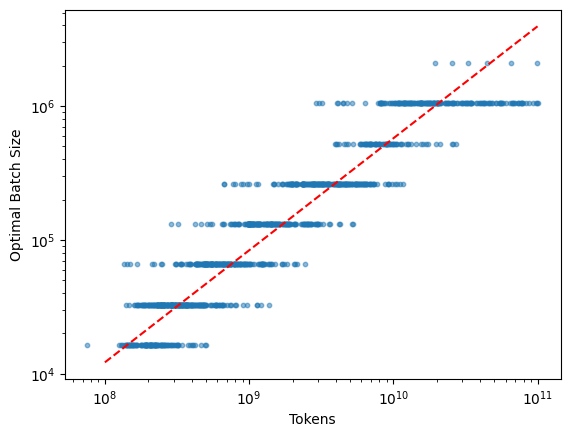

In [27]:
df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "target_loss"])["tokens"].idxmin()]

plt.scatter(df_["tokens"], df_["batch_size"]*2048, alpha=0.5, s=10)

xs = np.logspace(8, 11, 50)
ys = 10**-2.609 * xs**0.8368
plt.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

plt.xscale("log")
plt.yscale("log")

plt.xlabel("Tokens")
plt.ylabel("Optimal Batch Size")

Text(0, 0.5, 'Batch Size')

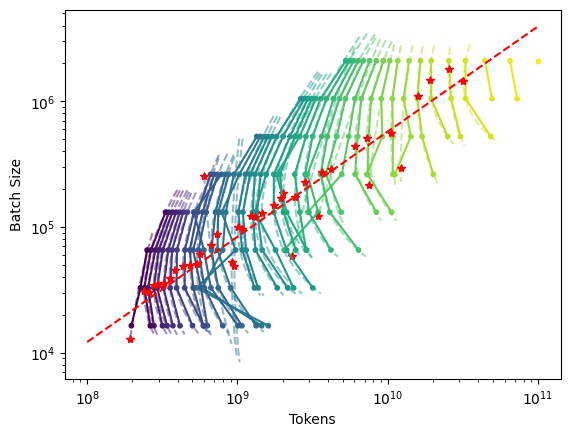

In [28]:
from scipy.optimize import least_squares

# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "batch_size"])["final_elbo"].idxmin()]
df_ = loss_df
df_ = df_.loc[(df_["hybrid_mixing_shift"] == 0.0) & (df_["num_layers"] == 8)]


vmin = df_["target_loss"].min()
vmax = df_["target_loss"].max()

def color(val, cmap="viridis_r", vmin=vmin, vmax=vmax):
    ratio = (val - vmin) / (vmax - vmin)
    ratio = max(0.0, min(1.0, ratio))
    cmap = plt.get_cmap(cmap)
    return cmap(ratio)

for target_loss, dfi in df_.groupby("target_loss"):
    # dfi = dfi.sort_values("batch_size")
    # dfi = dfi.loc[dfi["steps"] >= 5000]
    idx = dfi.groupby("batch_size")["steps"].idxmin()
    dfi = dfi.loc[idx]
    dfi = dfi.loc[dfi["steps"] >= 2500]
    ys = dfi["batch_size"]*2048
    # xs = dfi["tokens"] / ys
    xs = dfi["steps"]
    # print(target_loss)
    # print(dfi.loc["name"])
    plt.plot(xs*ys, ys, alpha=1.0, color=color(target_loss))
    plt.scatter(xs*ys, ys, c=dfi["target_loss"], alpha=1.0, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)

    if len(xs) < 3:
        continue

    def resid(p):
        a, b, c = p
        return ((xs / a)**c - 1) * ((ys / b)**c - 1) - 1
    res = least_squares(resid, x0=[1.0, 1.0, 1.0], bounds=(1e-8, np.inf))
    a, b, c = res.x

    x = np.logspace(np.log10(xs.min())-0.1, np.log10(xs.max())+0.1, 100)
    y = b * np.power(((x / a)**c) / (((x / a)**c) - 1.0), 1.0 / c)
    plt.plot(x*y, y, "--", color=color(target_loss), alpha=0.5)
    # print(a, b, c)

    opt_idx = np.argmin(x*y)
    plt.plot(x[opt_idx]*y[opt_idx], y[opt_idx], "*", color="red")


xs = np.logspace(8, 11, 50)
ys = 10**-2.609 * xs**0.8368
plt.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

plt.xscale("log")
plt.yscale("log")
# plt.xlim(2000, None)

plt.xlabel("Tokens")
plt.ylabel("Batch Size")

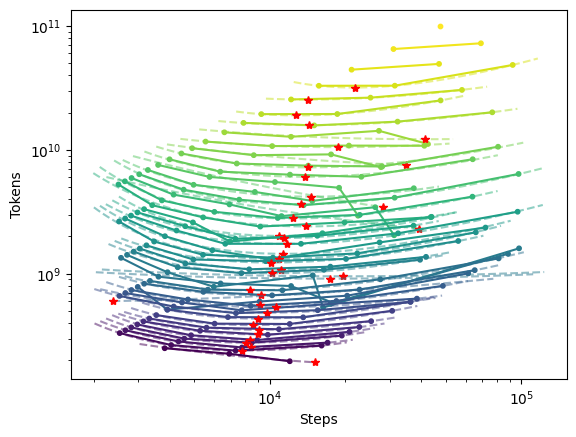

In [29]:
from scipy.optimize import least_squares

# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "batch_size"])["final_elbo"].idxmin()]
df_ = loss_df
df_ = df_.loc[(df_["hybrid_mixing_shift"] == 0.0) & (df_["num_layers"] == 8)]


def log_power_law(x, a, b, c):
    return np.log(np.exp(a) * x**-b + np.exp(c))

vmin = df_["target_loss"].min()
vmax = df_["target_loss"].max()

def color(val, cmap="viridis_r", vmin=vmin, vmax=vmax):
    ratio = (val - vmin) / (vmax - vmin)
    ratio = max(0.0, min(1.0, ratio))
    cmap = plt.get_cmap(cmap)
    return cmap(ratio)

for target_loss, dfi in df_.groupby("target_loss"):
    # dfi = dfi.sort_values("batch_size")
    # dfi = dfi.loc[dfi["steps"] >= 5000]
    idx = dfi.groupby("batch_size")["steps"].idxmin()
    dfi = dfi.loc[idx]
    dfi = dfi.loc[dfi["steps"] >= 2500]
    ys = dfi["batch_size"]*2048
    # xs = dfi["tokens"] / ys
    xs = dfi["steps"]
    # print(target_loss)
    # print(dfi.loc["name"])
    plt.plot(xs, ys*xs, alpha=1.0, color=color(target_loss))
    plt.scatter(xs, ys*xs, c=dfi["target_loss"], alpha=1.0, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)

    if len(xs) < 3:
        continue

    def resid(p):
        a, b, c = p
        return ((xs / a)**c - 1) * ((ys / b)**c - 1) - 1
    res = least_squares(resid, x0=[1.0, 1.0, 1.0], bounds=(1e-8, np.inf))
    # popt, _ = curve_fit(log_power_law, xs, np.log(ys), p0=(0.0, 0.1, -1.0), maxfev=100_000)
    # popt, _ = curve_fit(to_solve, np.array([xs, ys]), target, p0=(1.0, 1.0), maxfev=100_000)
    a, b, c = res.x

    x = np.logspace(np.log10(xs.min())-0.1, np.log10(xs.max())+0.1, 100)
    y = b * np.power(((x / a)**c) / (((x / a)**c) - 1.0), 1.0 / c)
    # y_fit = np.exp(log_power_law(x_fit, *popt))
    plt.plot(x, y*x, "--", color=color(target_loss), alpha=0.5)
    # print(a, b, c)

    opt_idx = np.argmin(x*y)
    plt.plot(x[opt_idx], y[opt_idx]*x[opt_idx], "*", color="red")


# xs = np.logspace(8, 11, 50)
# ys = 10**-2.609 * xs**0.8368
# plt.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

plt.xscale("log")
plt.yscale("log")
# plt.xlim(2000, None)

plt.xlabel("Steps")
plt.ylabel("Tokens");

Text(0, 0.5, 'Batch Size')

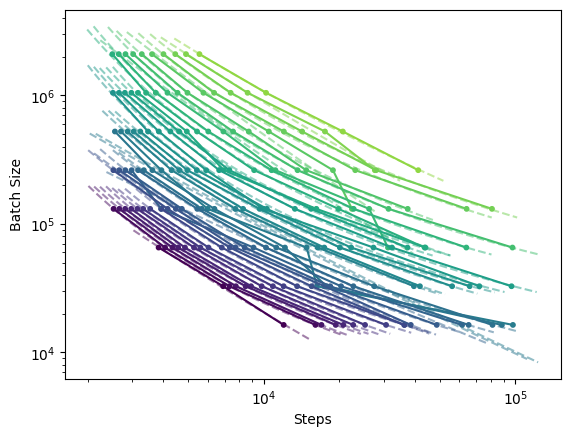

In [30]:
from scipy.optimize import least_squares

# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "batch_size"])["final_elbo"].idxmin()]
df_ = loss_df
df_ = df_.loc[(df_["hybrid_mixing_shift"] == 0.0) & (df_["num_layers"] == 8)]


def log_power_law(x, a, b, c):
    return np.log(np.exp(a) * x**-b + np.exp(c))

vmin = df_["target_loss"].min()
vmax = df_["target_loss"].max()


ps = []

def color(val, cmap="viridis_r", vmin=vmin, vmax=vmax):
    ratio = (val - vmin) / (vmax - vmin)
    ratio = max(0.0, min(1.0, ratio))
    cmap = plt.get_cmap(cmap)
    return cmap(ratio)

points = []
for target_loss, dfi in df_.groupby("target_loss"):
    if target_loss < 3.4:
        continue
    # dfi = dfi.sort_values("batch_size")
    # dfi = dfi.loc[dfi["steps"] >= 5000]
    idx = dfi.groupby("batch_size")["steps"].idxmin()
    dfi = dfi.loc[idx]
    dfi = dfi.loc[dfi["steps"] >= 2500]
    ys = dfi["batch_size"]*2048
    # xs = dfi["tokens"] / ys
    xs = dfi["steps"]
    # print(target_loss)
    # print(dfi.loc["name"])
    plt.plot(xs, ys, alpha=1.0, color=color(target_loss))
    plt.scatter(xs, ys, c=dfi["target_loss"], alpha=1.0, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)

    points.extend([{"steps": s, "batch_size": b*2048, "target_loss": target_loss} for s, b in zip(xs, ys)])

    if len(xs) < 3:
        continue

    def resid(p):
        a, b, c = p
        return ((xs / a)**c - 1) * ((ys / b)**c - 1) - 1
    res = least_squares(resid, x0=[1.0, 1.0, 1.0], bounds=(1e-8, np.inf))
    # popt, _ = curve_fit(log_power_law, xs, np.log(ys), p0=(0.0, 0.1, -1.0), maxfev=100_000)
    # popt, _ = curve_fit(to_solve, np.array([xs, ys]), target, p0=(1.0, 1.0), maxfev=100_000)
    a, b, c = res.x
    ps.append({"target_loss": target_loss, "a": a, "b": b, "c": c})

    pad = 0.1
    x = np.logspace(np.log10(xs.min())-pad, np.log10(xs.max())+pad, 100)
    y = b * np.power(((x / a)**c) / (((x / a)**c) - 1.0), 1.0 / c)
    # y_fit = np.exp(log_power_law(x_fit, *popt))
    plt.plot(x, y, "--", color=color(target_loss), alpha=0.5)
    # print(target_loss, [a, b, c])

    # opt_idx = np.argmin(x*y)
    # plt.plot(x[opt_idx]*y[opt_idx], y[opt_idx], "*", color="red")


# xs = np.logspace(8, 11, 50)
# ys = 10**-2.609 * xs**0.8368
# plt.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

plt.xscale("log")
plt.yscale("log")
# plt.xlim(2000, None)

plt.xlabel("Steps")
plt.ylabel("Batch Size")

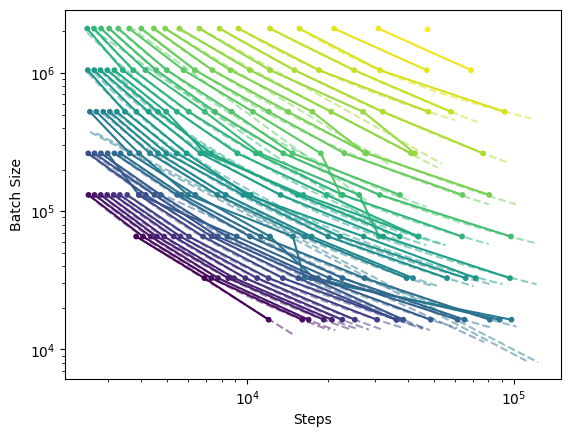

In [31]:
from scipy.optimize import least_squares

# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "batch_size"])["final_elbo"].idxmin()]
df_ = loss_df
df_ = df_.loc[(df_["hybrid_mixing_shift"] == 0.0) & (df_["num_layers"] == 8)]


def log_power_law(x, a, b, c):
    return np.log(np.exp(a) * x**-b + np.exp(c))

vmin = df_["target_loss"].min()
vmax = df_["target_loss"].max()


ps = []

def color(val, cmap="viridis_r", vmin=vmin, vmax=vmax):
    ratio = (val - vmin) / (vmax - vmin)
    ratio = max(0.0, min(1.0, ratio))
    cmap = plt.get_cmap(cmap)
    return cmap(ratio)

points = []
for target_loss, dfi in df_.groupby("target_loss"):
    # dfi = dfi.sort_values("batch_size")
    # dfi = dfi.loc[dfi["steps"] >= 5000]
    idx = dfi.groupby("batch_size")["steps"].idxmin()
    dfi = dfi.loc[idx]
    dfi = dfi.loc[dfi["steps"] >= 2500]
    ys = dfi["batch_size"]*2048
    # xs = dfi["tokens"] / ys
    xs = dfi["steps"]
    # print(target_loss)
    # print(dfi.loc["name"])
    plt.plot(xs, ys, alpha=1.0, color=color(target_loss))
    plt.scatter(xs, ys, c=dfi["target_loss"], alpha=1.0, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)

    points.extend([{"steps": s, "batch_size": b*2048, "target_loss": target_loss} for s, b in zip(xs, ys)])

    if len(xs) < 3:
        continue

    def resid(p):
        a, b, c = p
        return a / xs**c + b / ys**c - target_loss
    res = least_squares(resid, x0=[100.0, 100.0, 0.1], bounds=(1e-8, np.inf))
    # popt, _ = curve_fit(log_power_law, xs, np.log(ys), p0=(0.0, 0.1, -1.0), maxfev=100_000)
    # popt, _ = curve_fit(to_solve, np.array([xs, ys]), target, p0=(1.0, 1.0), maxfev=100_000)
    a, b, c = res.x
    ps.append({"target_loss": target_loss, "a": a, "b": b, "c": c})

    pad = 0.1
    x = np.logspace(np.log10(xs.min()), np.log10(xs.max())+pad, 100)
    # y = b * np.power(((x / a)**c) / (((x / a)**c) - 1.0), 1.0 / c)
    y = (b / (target_loss - a / (x**c)))**(1 / c)
    # y_fit = np.exp(log_power_law(x_fit, *popt))
    plt.plot(x, y, "--", color=color(target_loss), alpha=0.5)
    # print(target_loss, [a, b, c])

    # opt_idx = np.argmin(x*y)
    # plt.plot(x[opt_idx]*y[opt_idx], y[opt_idx], "*", color="red")


# xs = np.logspace(8, 11, 50)
# ys = 10**-2.609 * xs**0.8368
# plt.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

plt.xscale("log")
plt.yscale("log")
# plt.xlim(2000, None)

plt.xlabel("Steps")
plt.ylabel("Batch Size");

Fitted parameters: [2.93369783e+02 1.42286835e-03 1.39986742e-05 2.50722129e-01
 2.35794810e+00 1.14950741e+00]


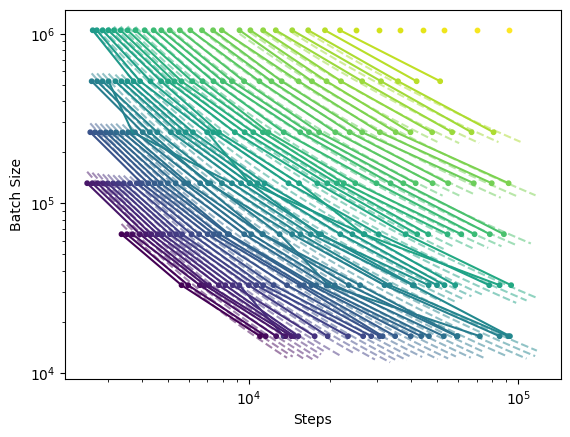

In [32]:
from scipy.optimize import least_squares

# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "batch_size"])["final_elbo"].idxmin()]
df_ = loss_df
df_ = df_.loc[(df_["hybrid_mixing_shift"] == 2.0) & (df_["num_layers"] == 16)]


def log_power_law(x, a, b, c):
    return np.log(np.exp(a) * x**-b + np.exp(c))

vmin = df_["target_loss"].min()
vmax = df_["target_loss"].max()



dfi = df_.copy()
idx = dfi.groupby(["target_loss", "batch_size"])["steps"].idxmin()
dfi = dfi.loc[idx]
xs = dfi["steps"].to_numpy()
ys = (dfi["batch_size"]*2048).to_numpy()
losses = dfi["target_loss"].to_numpy()

def resid(p):
    a1, a2, b1, b2, c1, c2 = p
    return ((xs/a1)**a2  - 1) * ((ys/b1)**b2 - 1) * ((losses/c1)**c2 - 1) - 1

res = least_squares(resid, x0=[1.0, 1.0, 1.0, 1.0, 1.0, 1.0], bounds=(1e-8, np.inf), loss="linear")
a1, a2, b1, b2, c1, c2 = res.x

print("Fitted parameters:", res.x)

ps = []

def color(val, cmap="viridis_r", vmin=vmin, vmax=vmax):
    ratio = (val - vmin) / (vmax - vmin)
    ratio = max(0.0, min(1.0, ratio))
    cmap = plt.get_cmap(cmap)
    return cmap(ratio)

points = []
for target_loss, dfi in df_.groupby("target_loss"):
    # dfi = dfi.sort_values("batch_size")
    # dfi = dfi.loc[dfi["steps"] >= 5000]
    idx = dfi.groupby("batch_size")["steps"].idxmin()
    dfi = dfi.loc[idx]
    dfi = dfi.loc[dfi["steps"] >= 2500]
    ys = dfi["batch_size"]*2048
    # xs = dfi["tokens"] / ys
    xs = dfi["steps"]
    # print(target_loss)
    # print(dfi.loc["name"])
    plt.plot(xs, ys, alpha=1.0, color=color(target_loss))
    plt.scatter(xs, ys, c=dfi["target_loss"], alpha=1.0, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)

    points.extend([{"steps": s, "batch_size": b*2048, "target_loss": target_loss} for s, b in zip(xs, ys)])

    if len(xs) < 3:
        continue

    pad = 0.1
    x = np.logspace(np.log10(xs.min()), np.log10(xs.max())+pad, 100)
    with np.errstate(divide="ignore", invalid="ignore"):
        X = (x / a1) ** a2 - 1.0
        L = (target_loss / c1) ** c2 - 1.0
        Y = 1.0 + 1.0 / (X * L)
        y = b1 * Y**(1.0 / b2)
        y = np.where(np.isfinite(y) & (Y > 0), y, np.nan)
    plt.plot(x, y, "--", color=color(target_loss), alpha=0.5)
    # print(target_loss, [a, b, c])

    # opt_idx = np.argmin(x*y)
    # plt.plot(x[opt_idx]*y[opt_idx], y[opt_idx], "*", color="red")


# xs = np.logspace(8, 11, 50)
# ys = 10**-2.609 * xs**0.8368
# plt.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

plt.xscale("log")
plt.yscale("log")
# plt.xlim(2000, None)

plt.xlabel("Steps")
plt.ylabel("Batch Size");

Fitted parameters: [2.86933504e+01 1.62792029e-03 1.76289882e+02 2.04119945e-03
 8.40878329e-02 2.35159616e+00]
MSE: 0.002393
Fitted parameters: [1.63987703e+02 7.21134285e-04 1.17933884e+03 1.82930143e-03
 1.02649714e-01 2.96104614e+00]
MSE: 0.002518
Fitted parameters: [1.92042208e+02 1.45892169e-03 6.08861233e-08 2.24202535e-01
 2.45639118e+00 6.81635427e-01]
MSE: 0.001976
Fitted parameters: [3.85894376e+01 4.20422439e-03 2.25402849e-08 1.56900582e-01
 1.90447693e+00 5.69043270e-01]
MSE: 0.001257
Fitted parameters: [2.92189154e+00 2.81827359e-04 1.23286618e+01 2.84838455e-04
 9.62557334e-05 1.14536687e+00]
MSE: 0.0005441
Fitted parameters: [8.26857833e+00 8.70468739e-04 4.14732246e+01 5.49219586e-04
 1.85492614e-02 1.96941499e+00]
MSE: 0.001677
Fitted parameters: [1.61637761e+01 9.88148628e-04 1.18525752e+02 5.07061110e-04
 1.53995106e-02 1.94876124e+00]
MSE: 0.0008832
Fitted parameters: [3.16860122e+01 3.13825790e-04 1.59075763e+02 2.82503124e-04
 7.59772315e-03 2.03566991e+00]
MSE:

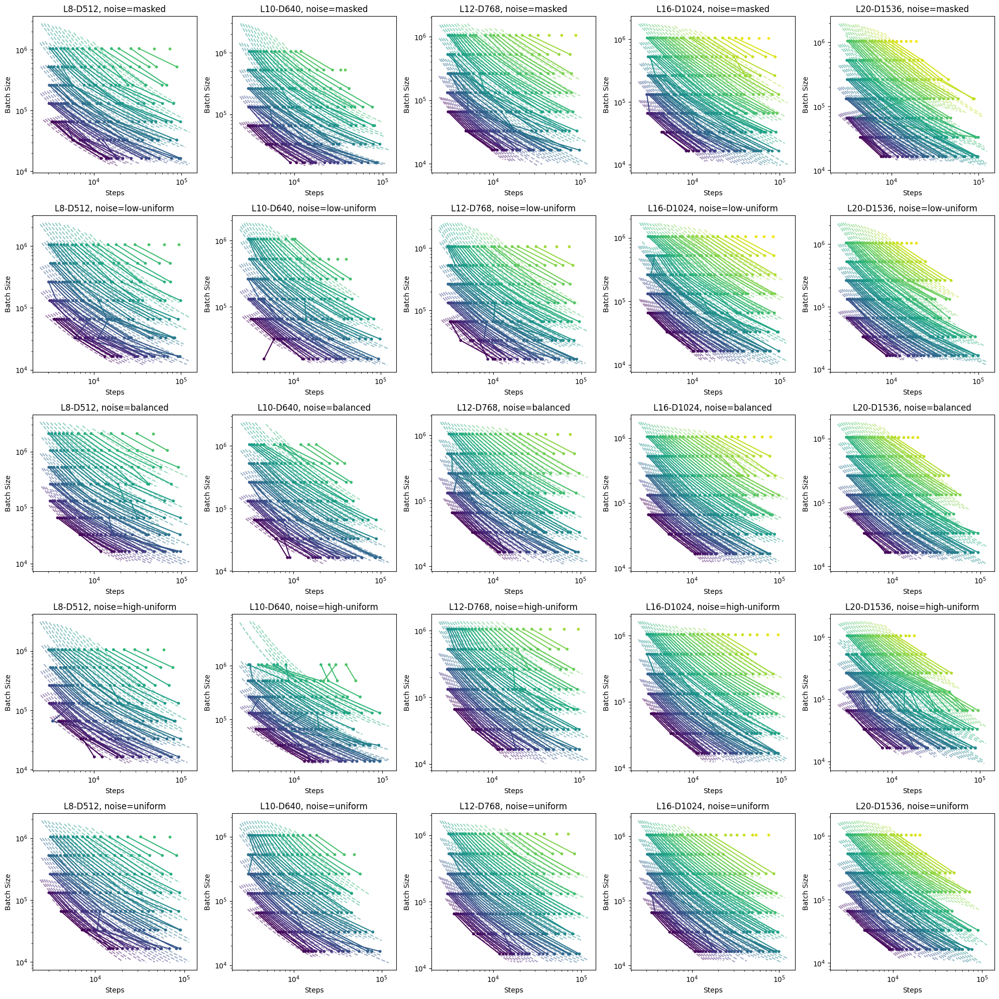

In [33]:
from scipy.optimize import least_squares

# fig, axs= plt.subplots(5, 5, figsize=(20, 20), sharey=True)
fig, axs= plt.subplots(5, 5, figsize=(20, 20))

# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "batch_size"])["final_elbo"].idxmin()]
df_ = loss_df

vmin = df_["target_loss"].min()
vmax = df_["target_loss"].max()

for i, (hybrid_mixing_shift, dfi) in enumerate(df_.groupby("hybrid_mixing_shift")):
    for j, ((num_layers, hidden_size), dfj) in enumerate(dfi.groupby(["num_layers", "hidden_size"])):
        ax = axs[i, j]
        # xs = dfj["steps"]
        # ys = dfj["batch_size"]*2048
        # losses = dfj["target_loss"]

        idx = dfj.groupby(["target_loss", "batch_size"])["steps"].idxmin()
        dfj = dfj.loc[idx]
        xs = dfj["steps"].to_numpy()
        ys = (dfj["batch_size"]*2048).to_numpy()
        losses = dfj["target_loss"].to_numpy()

        def resid(p):
            a1, a2, b1, b2, c1, c2 = p
            return ((xs/a1)**a2  - 1) * ((ys/b1)**b2 - 1) * ((losses/c1)**c2 - 1) - 1

        res = least_squares(resid, x0=[1.0, 1.0, 1.0, 1.0, 1.0, 1.0], bounds=(1e-8, np.inf), loss="linear")
        a1, a2, b1, b2, c1, c2 = res.x

        print("Fitted parameters:", res.x)

        # def resid(p):
        #     a, b, c, d = p
        #     return np.log(a / xs**c + b / ys**d) - np.log(losses)
        # res = least_squares(resid, x0=[100.0, 100.0, 0.1, 0.1], bounds=(1e-8, np.inf))
        # a, b, c, d = res.x

        mse = np.mean(resid([a1, a2, b1, b2, c1, c2])**2)
        print("MSE: {:.4g}".format(mse))


        def color(val, cmap="viridis_r", vmin=vmin, vmax=vmax):
            ratio = (val - vmin) / (vmax - vmin)
            ratio = max(0.0, min(1.0, ratio))
            cmap = plt.get_cmap(cmap)
            return cmap(ratio)

        points = []
        for target_loss, dfk in dfj.groupby("target_loss"):
            # dfk = dfk.sort_values("batch_size")
            # dfk = dfk.loc[dfk["steps"] >= 5000]
            idx = dfk.groupby("batch_size")["steps"].idxmin()
            dfk = dfk.loc[idx]
            dfk = dfk.loc[dfk["steps"] >= 3000]
            ys = dfk["batch_size"]*2048
            # xs = dfk["tokens"] / ys
            xs = dfk["steps"]
            # print(target_loss)
            # print(dfk.loc["name"])
            ax.plot(xs, ys, alpha=1.0, color=color(target_loss))
            ax.scatter(xs, ys, c=dfk["target_loss"], alpha=1.0, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)

            points.extend([{"steps": s, "batch_size": b*2048, "target_loss": target_loss} for s, b in zip(xs, ys)])

            if len(xs) < 3:
                continue

            pad = 0.1
            x = np.logspace(np.log10(xs.min())-pad, np.log10(xs.max())+pad, 100)
            with np.errstate(divide="ignore", invalid="ignore"):
                X = (x / a1) ** a2 - 1.0
                L = (target_loss / c1) ** c2 - 1.0
                Y = 1.0 + 1.0 / (X * L)
                y = b1 * Y**(1.0 / b2)
                y = np.where(np.isfinite(y) & (Y > 0), y, np.nan)
                
            # y = b * np.power(((x / a)**c) / (((x / a)**c) - 1.0), 1.0 / c)
            # y = (b / (target_loss - a / (x**c)))**(1 / d)
            # y_fit = np.exp(log_power_law(x_fit, *popt))
            ax.plot(x, y, "--", color=color(target_loss), alpha=0.5)

            # opt_idx = np.argmin(x*y)
            # ax.plot(x[opt_idx], y[opt_idx], "*", color="red")

        # xs = np.logspace(8, 11, 50)
        # ys = 10**-2.609 * xs**0.8368
        # ax.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_title(f"L{num_layers}-D{hidden_size}, noise={get_noise_label(hybrid_mixing_shift)}")

        ax.set_xlabel("Steps")
        ax.set_ylabel("Batch Size")

fig.tight_layout()

MSE: 0.0003785


MSE: 0.0002426
MSE: 0.000404
MSE: 0.0005055
MSE: 0.0003895
MSE: 0.0003361
MSE: 0.0001916
MSE: 0.0003588
MSE: 0.0004284
MSE: 0.0002471
MSE: 0.0002945
MSE: 0.0003803
MSE: 0.0003025
MSE: 0.0003602
MSE: 0.0002385
MSE: 0.0002831
MSE: 0.0003357
MSE: 0.0003085
MSE: 0.0003605
MSE: 0.0002454
MSE: 0.0002687
MSE: 0.0001497
MSE: 0.0003111
MSE: 0.0003744
MSE: 0.0002029


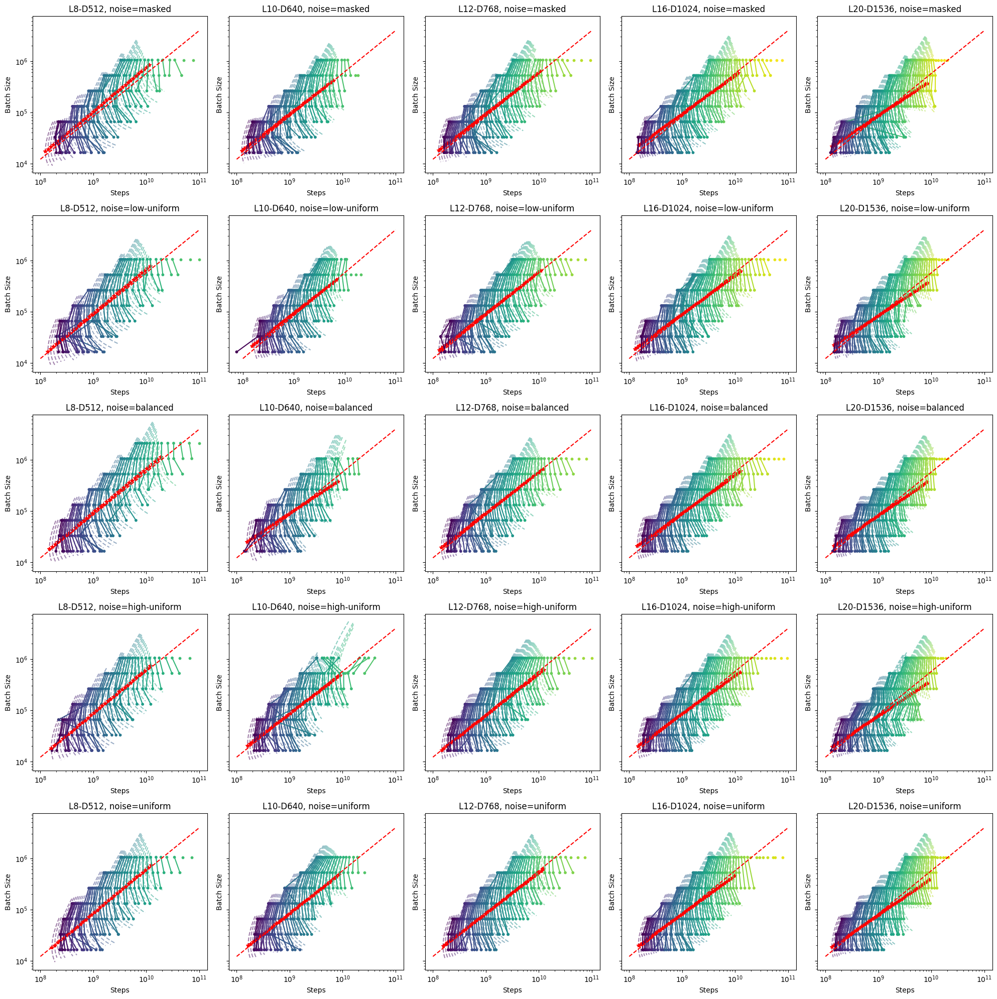

In [34]:
from scipy.optimize import least_squares

fig, axs= plt.subplots(5, 5, figsize=(20, 20), sharey=True)

# df_ = loss_df.loc[loss_df.groupby(["hybrid_mixing_shift", "num_layers", "batch_size"])["final_elbo"].idxmin()]
df_ = loss_df

vmin = df_["target_loss"].min()
vmax = df_["target_loss"].max()

for i, (hybrid_mixing_shift, dfi) in enumerate(df_.groupby("hybrid_mixing_shift")):
    for j, ((num_layers, hidden_size), dfj) in enumerate(dfi.groupby(["num_layers", "hidden_size"])):
        ax = axs[i, j]
        xs = dfj["steps"]
        ys = dfj["batch_size"]*2048
        losses = dfj["target_loss"]

        def resid(p):
            a, b, c, d = p
            return np.log(a / xs**c + b / ys**d) - np.log(losses)
        res = least_squares(resid, x0=[100.0, 100.0, 0.1, 0.1], bounds=(1e-8, np.inf))
        a, b, c, d = res.x

        mse = np.mean(resid([a, b, c, d])**2)
        print("MSE: {:.4g}".format(mse))


        def color(val, cmap="viridis_r", vmin=vmin, vmax=vmax):
            ratio = (val - vmin) / (vmax - vmin)
            ratio = max(0.0, min(1.0, ratio))
            cmap = plt.get_cmap(cmap)
            return cmap(ratio)

        points = []
        for target_loss, dfi in dfj.groupby("target_loss"):
            # dfi = dfi.sort_values("batch_size")
            # dfi = dfi.loc[dfi["steps"] >= 5000]
            idx = dfi.groupby("batch_size")["steps"].idxmin()
            dfi = dfi.loc[idx]
            dfi = dfi.loc[dfi["steps"] >= 3000]
            ys = dfi["batch_size"]*2048
            # xs = dfi["tokens"] / ys
            xs = dfi["steps"]
            # print(target_loss)
            # print(dfi.loc["name"])
            ax.plot(xs*ys, ys, alpha=1.0, color=color(target_loss))
            ax.scatter(xs*ys, ys, c=dfi["target_loss"], alpha=1.0, s=10, cmap="viridis_r", vmin=vmin, vmax=vmax)

            points.extend([{"steps": s, "batch_size": b*2048, "target_loss": target_loss} for s, b in zip(xs, ys)])

            if len(xs) < 3:
                continue

            pad = 0.1
            x = np.logspace(np.log10(xs.min())-pad, np.log10(xs.max())+pad, 100)
            # y = b * np.power(((x / a)**c) / (((x / a)**c) - 1.0), 1.0 / c)
            y = (b / (target_loss - a / (x**c)))**(1 / d)
            # y_fit = np.exp(log_power_law(x_fit, *popt))
            ax.plot(x*y, y, "--", color=color(target_loss), alpha=0.5)

            opt_idx = np.argmin(x*y)
            ax.plot(x[opt_idx]*y[opt_idx], y[opt_idx], "*", color="red")

        xs = np.logspace(8, 11, 50)
        ys = 10**-2.609 * xs**0.8368
        ax.plot(xs, ys, "--", label="B*Tokens^0.8368", color="red")

        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_title(f"L{num_layers}-D{hidden_size}, noise={get_noise_label(hybrid_mixing_shift)}")

        ax.set_xlabel("Steps")
        ax.set_ylabel("Batch Size")

fig.tight_layout()